# TASK 1 - Simulation of radial sampling

Radial Sampling is a sub-Nyquist sampling technique in which “spikes” (lines at different angles) are acquired in the k-space.

Radial methods generate data points that do not fall into a rectangular matrix. To efficiently process such non-uniformly acquired data, these points must be morphed into a Cartesian format, an iterative process commonly referred to as "gridding".

The major benefit of radial sampling is relative insensitivity to motion artifacts. Unlike Cartesian methods, radial sampling does not have unique frequency and phase-encode directions. Noise from moving anatomic structures thus does not propagate as discrete ghosts along a single phase-encode direction, but is distributed more diffusely across the entire image. 

In radial acquisition, the center of k-space is oversampled and continuously updated due to the overlapping "spokes" that repeatedly pass through this region. This redundancy can be exploited to detect and correct for movement if the signal from the k-space center changes between views. 

## SigPy package for MRI
For this task, we will use the SigPy package for MRI. Here, https://github.com/mikgroup/sigpy-mri-tutorial, we can find a tutorial. Specifically, we will be looking at the radial function in the package SigPy, https://sigpy.readthedocs.io/en/latest/_modules/sigpy/mri/samp.html#radial.

In [1]:
# Task 1 - Import libraries
%matplotlib notebook
import SimpleITK as sitk
import numpy as np
import sigpy as sp
from sigpy.mri import samp

import sigpy.plot as pl

import os
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
from skimage import filters

In [2]:
# Needed functions used throught the project
def fftc_2d(_data):
    data = _data.copy()
    data = np.fft.ifftshift(data)
    # Normalization mode (see numpy.fft). Default is “backward”. 
    # Indicates which direction of the forward/backward pair of transforms 
    # is scaled and with what normalization factor.
    
    data = np.fft.fft2(data, norm="ortho")
    return np.fft.fftshift(data)    

def ifftc_2d(_data):
    data = _data.copy()
    data = np.fft.ifftshift(data)
    data = np.fft.ifft2(data, norm="ortho")
    return np.fft.fftshift(data)    

def show_image(image,title): # plot the magnitude of the image
    plt.figure()
    plt.imshow(np.abs(image))#, cmap='gray') # If we want them in grayscale from the beginning
    plt.title(title, size=10)
    plt.show()

def show_kspace(kspace,title): # PLot the magnitude of the kspace
    plt.figure()
    plt.imshow(np.log(1 + np.abs(kspace)))#, cmap='gray')
    plt.title(title, size=16)
    plt.show()


Real size of our original 3D image: (256, 256, 90, 1, 2)
Size of original array:(2, 1, 90, 256, 256)


<IPython.core.display.Javascript object>


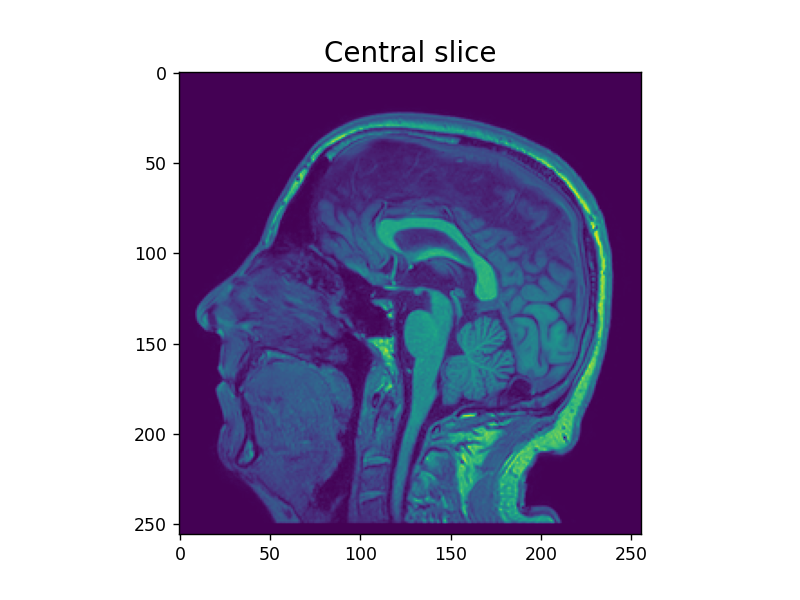

0
549


In [3]:
# Read image - MRI brain

""" In the nifti format, the first three dimensions are reserved to define the three spatial dimensions — x, y and z —, 
while the fourth dimension is reserved to define the time points — t. The remaining dimensions, from fifth to seventh, 
are for other uses. The fifth dimension, however, can still have some predefined uses, such as to store voxel-specific 
distributional parameters or to hold vector-based data."""

sitk_t1 = sitk.ReadImage('t1.nii.gz')
sz_img = sitk_t1.GetSize()
print(f'Real size of our original 3D image: {sz_img}')    # Real size of our image - (256, 256, 90, 1, 2)
                                                          # I have 90 slices of a 256x256 matrix
t1_data = sitk.GetArrayFromImage(sitk_t1)
sz_img_ndarray = np.shape(t1_data)
print(f'Size of original array:{sz_img_ndarray}') # size of the matrix - (2, 1, 90, 256, 256)

# Central Slice: 45
slice_img = t1_data[0,0,int(sz_img_ndarray[2]/2),:,:]

# We plot only the middle slice
# You can access the indexes in the matrix differently :)
# MODE 1
""" plt.figure()
plt.imshow(t1_data[0][0][45])
plt.show()"""

# MODE 2
plt.figure()
plt.title("Central slice", size=16)
plt.imshow(slice_img)
plt.show()

# Initially, our pixels value go from 0 to 549
print(np.min(slice_img))
print(np.max(slice_img))




<IPython.core.display.Javascript object>


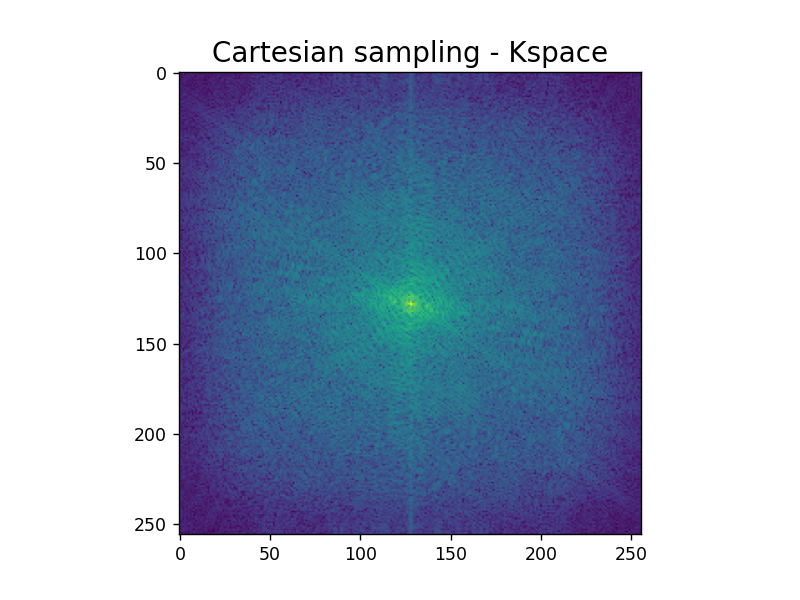

<IPython.core.display.Javascript object>


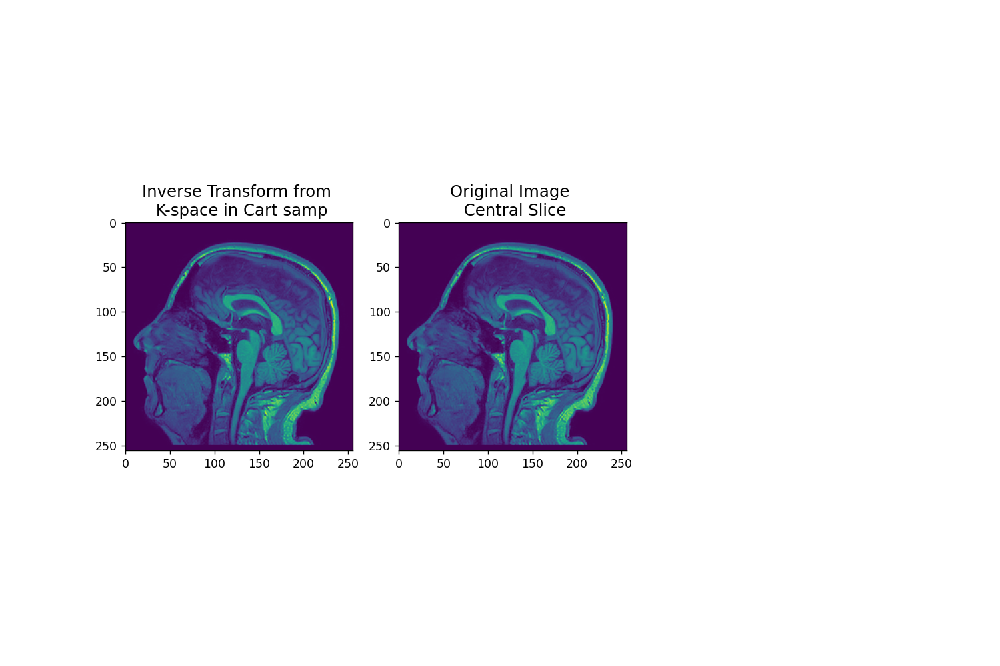

(-1.1368683772161603e-13-3.29250515740398e-15j)
(549-5.2171808540002473e-14j)
3.469446951953614e-18
549.0
-1.1368683772161603e-13
549.0


In [4]:
# TASK 1: Simulation of radial sampling
# Cartesian sampling - Kspace
kspace_cart = fftc_2d(slice_img)
show_kspace(kspace_cart,'Cartesian sampling - Kspace')

# Direct inverse FT of the cartesian k-space - Direct reconstruction
image_cart = ifftc_2d(kspace_cart)
plt.figure(figsize=(12,8))
plt.subplot(131)
plt.title('Inverse Transform from \n K-space in Cart samp', size = 14)
plt.imshow(np.abs(image_cart))#, cmap='gray') # We are plotting the norm (real part of the image)
plt.subplot(132)
plt.title("Original Image \n Central Slice", size=14)
plt.imshow(slice_img)

# After inverse FFT from cartesian sampling 
print(np.min(image_cart))
print(np.max(image_cart))

print(np.min(np.abs(image_cart))) # Min of the module
print(np.max(np.abs(image_cart))) # Max of the module

print(np.min(np.real(image_cart)))
print(np.max(np.real(image_cart)))

<IPython.core.display.Javascript object>


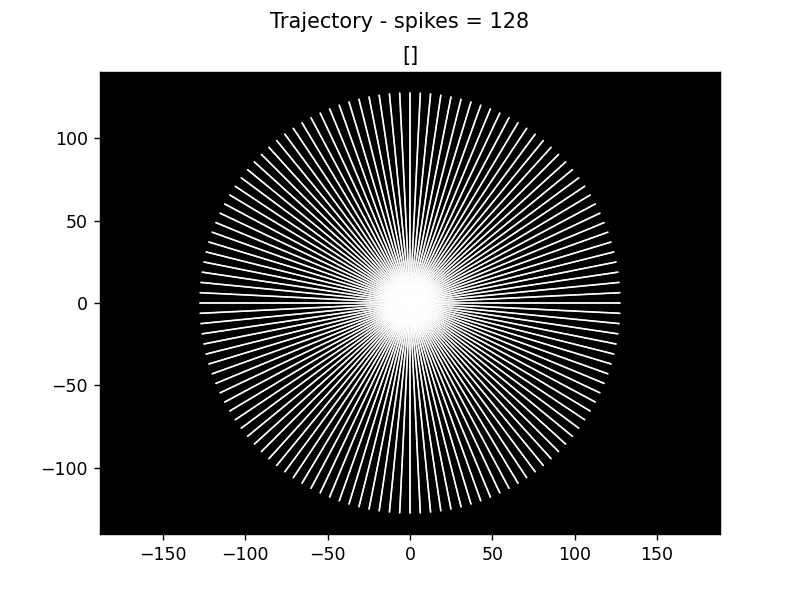

<IPython.core.display.Javascript object>


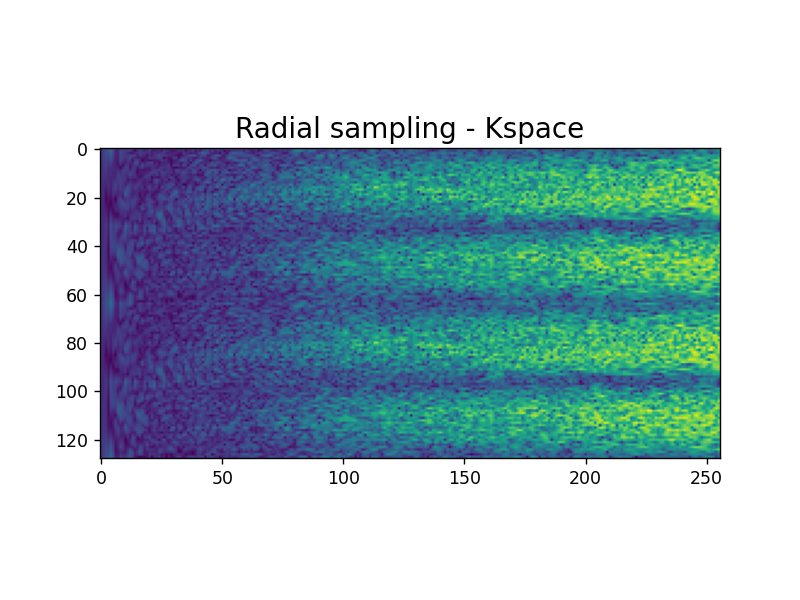

<IPython.core.display.Javascript object>


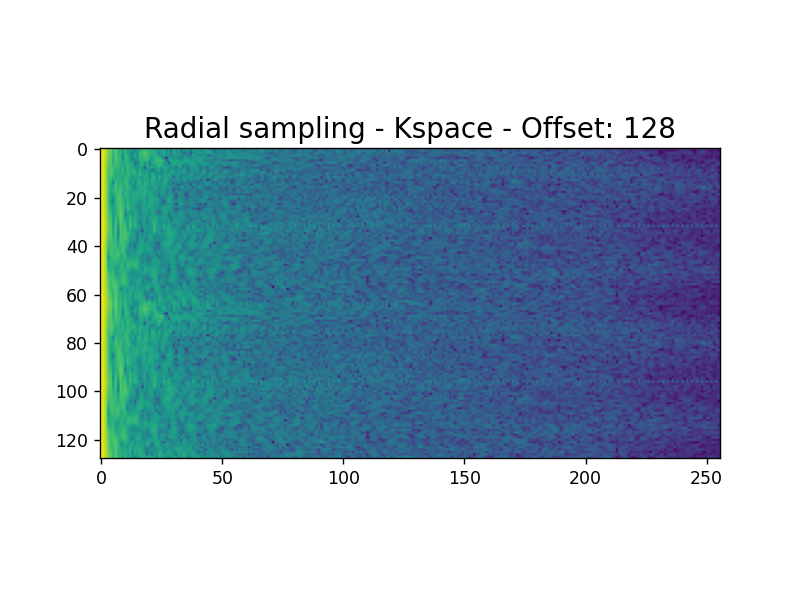

(64, 512)


<IPython.core.display.Javascript object>


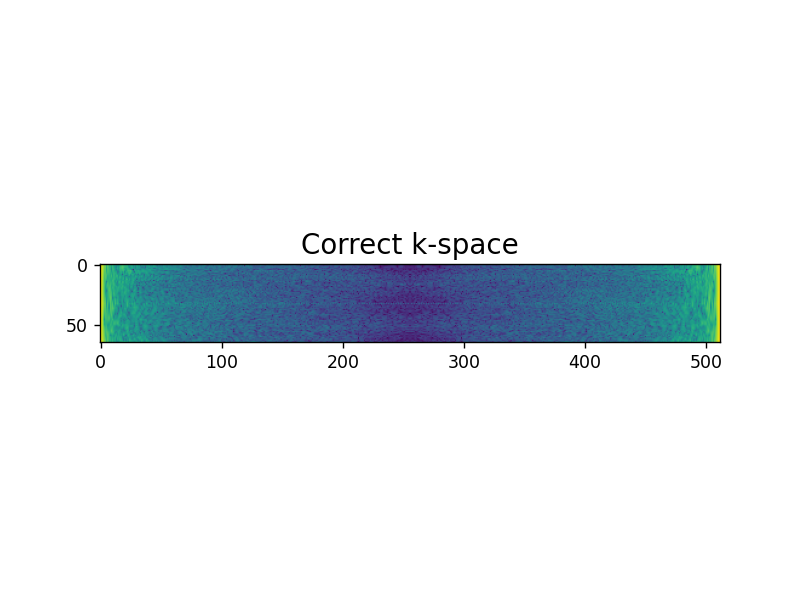

In [5]:
# Calculating radial coordinates of the k-space

# sigpy.mri.radial(coord_shape, img_shape)
        # coord_shape = vector [number of spikes, number of acquisitions per spike, dimension]
        # img_shape =  size of the image
        
spikes = 128 # 128/2 lines in the space

# Radial coordinates of the k-space with radial sampling - Set the golden angle to false so we get angularly equidistant lines
coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden =  False)
title = f'Trajectory - spikes = {spikes}'
pl.ScatterPlot(coord_radial,title = title)

# Now, we use this coordinates to select the values in the k-space and use it later to reconstruct the image
kspace_rad = sp.interpolate(kspace_cart, coord_radial) # In the example code, they use some offset
show_kspace(kspace_rad,'Radial sampling - Kspace')

# kspace with offset
kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
show_kspace(kspace_rad_off,f'Radial sampling - Kspace - Offset: {int(256/2)}')

# We reshape the kspace to show the correct kspace (2 ('opposite') spikes per line)
kspace_reshape =[]
m = int(kspace_rad_off.shape[0]/2)
for i in range(m):
    arr= np.concatenate((kspace_rad_off[i,:],np.flip(kspace_rad_off[m+i,:])), axis = 0)
    kspace_reshape.append(arr)

kspace_reshape = np.array(kspace_reshape)
print(kspace_reshape.shape)
show_kspace(kspace_reshape,'Correct k-space')


In [6]:
# Estimate the acceleration factor R
# R = number of initial total points in k-space/number of actual points = N/M
N =  256*256 # image size
M = spikes*256 # number of spikes*number of point per spike
R = N/M
print(f'Our estimated acceleration factor R={R}')

Our estimated acceleration factor R=2.0


512


<IPython.core.display.Javascript object>


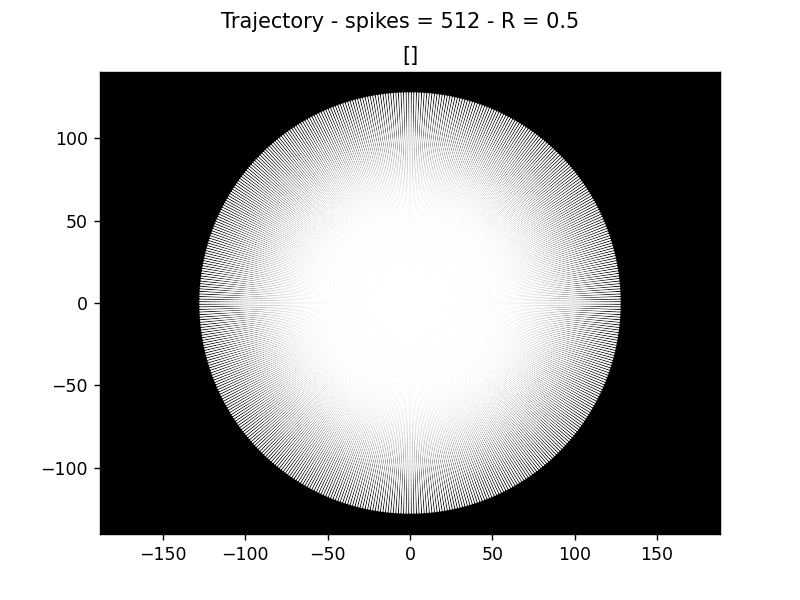

128


<IPython.core.display.Javascript object>


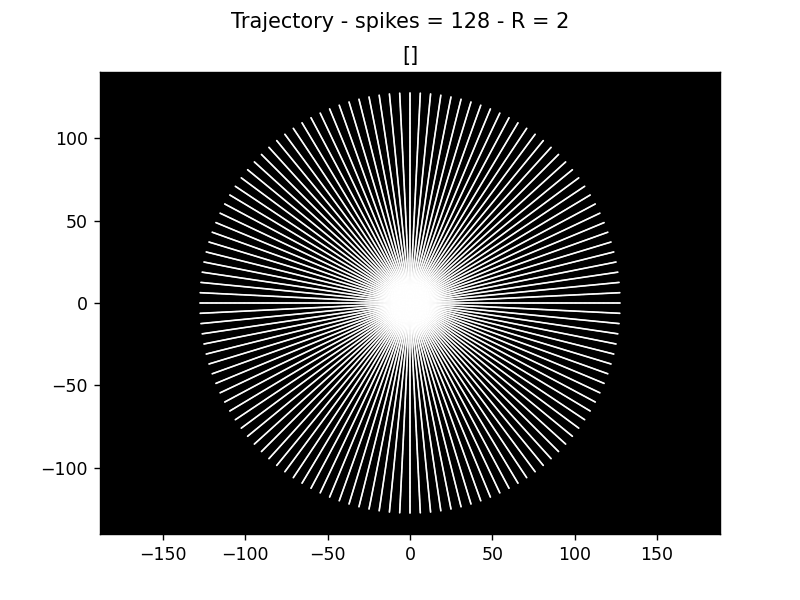

51


<IPython.core.display.Javascript object>


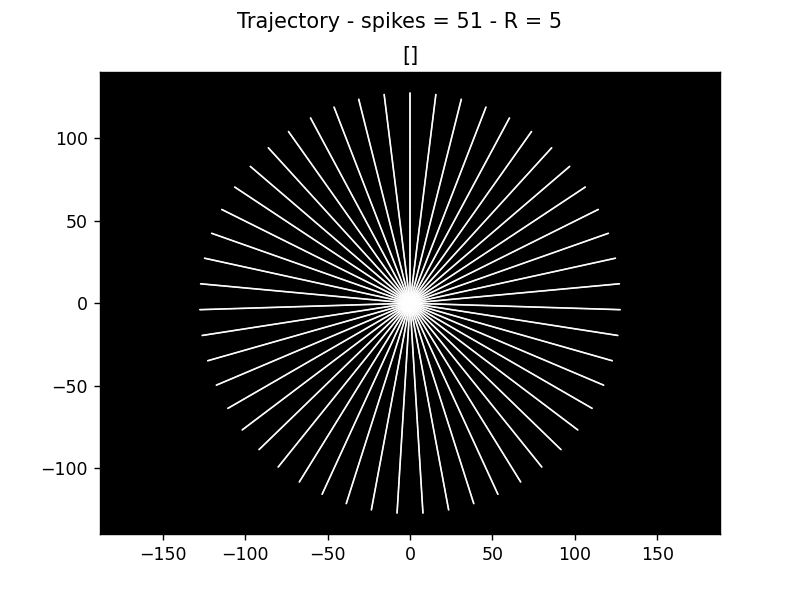

26


<IPython.core.display.Javascript object>


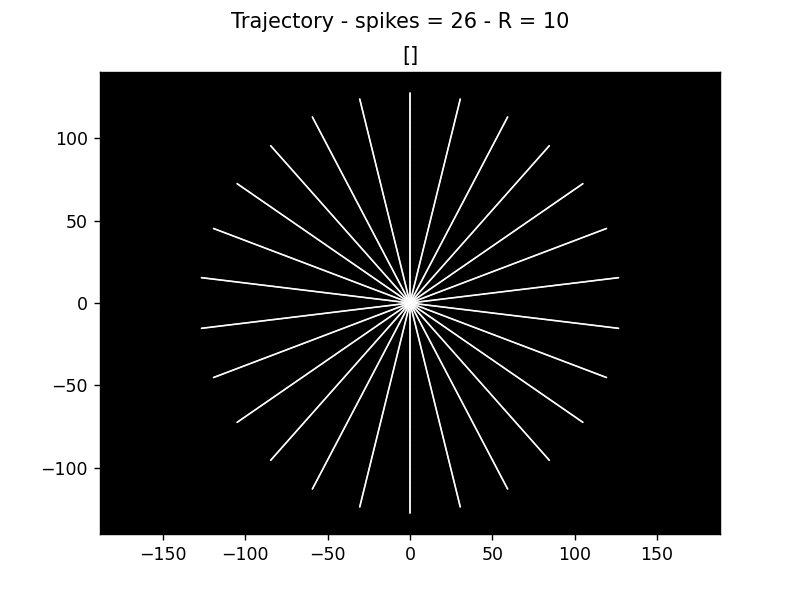

2


<IPython.core.display.Javascript object>


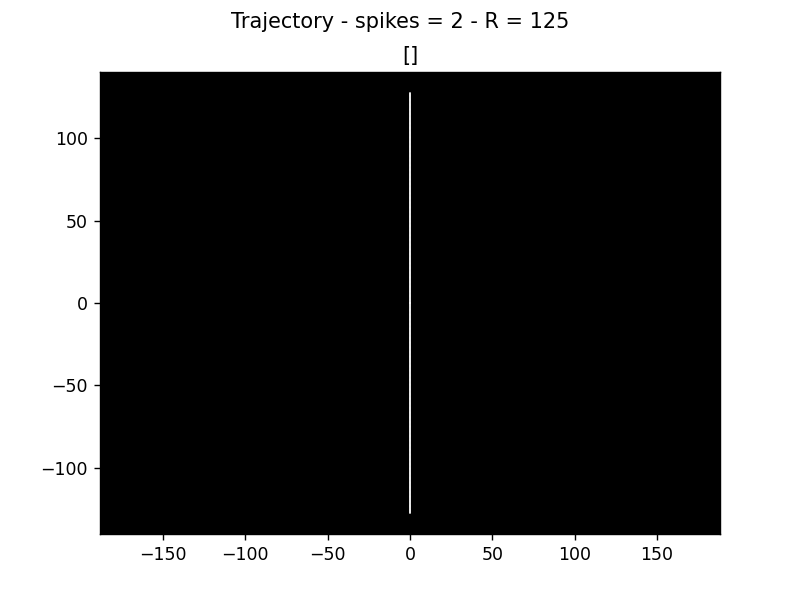

In [7]:
# Try with differen R values - Trajectories of radial sampling
R = [0.5,2,5,10,125]

for c in R:
    spikes = int(np.round(256/c)) # This needs to be an integer
    print(spikes)
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden =  False)
    # Plot trajectories - radial sampling
    title = f'Trajectory - spikes = {spikes} - R = {c}'
    pl.ScatterPlot(coord_radial,title = title)
    

<IPython.core.display.Javascript object>


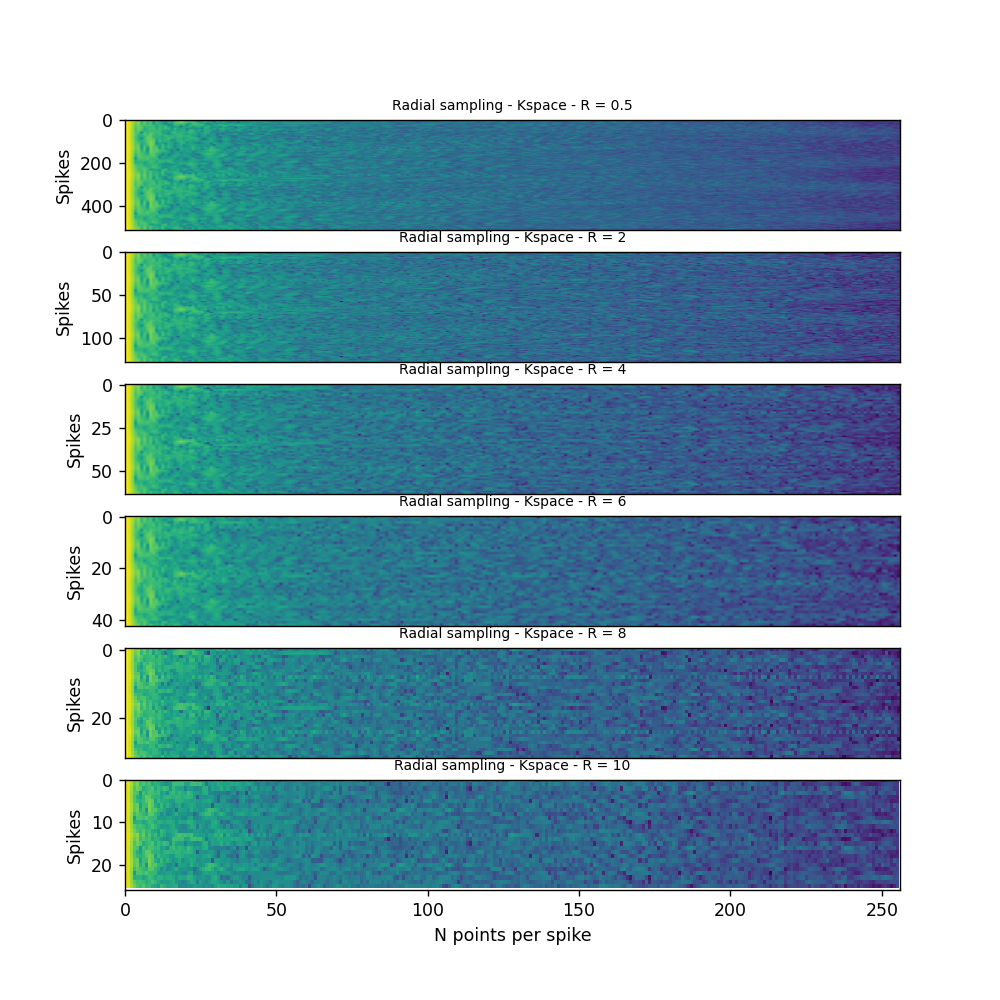

Text(0.5, 0, 'N points per spike')

In [8]:
# Try with different R values - Interpolaiton of Kspace with radial sampling
R = [0.5, 2,4,6,8,10]

fig, ax = plt.subplots(nrows=len(R), ncols=1, figsize=(8, 8),sharex=False, sharey=False)
#plt.gray()

i = 0

for c in R:
    spikes = int(np.round(256/c)) # This needs to be an integer
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden = False)
    # kspace with offset - Interpolation
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Visualizing results
    ax[i].imshow(np.abs(np.log(1 + kspace_rad_off)),aspect = 'auto') #  cmap='gray', 
    if i == len(R)-1:
        ax[i].get_xaxis().set_visible(True)
        ax[i].set_xlim([0,256])
        ax[i].set_ylim([spikes,0])
    else:
        ax[i].get_xaxis().set_visible(False)
        
    ax[i].set_ylabel('Spikes')
    ax[i].set_title(f'Radial sampling - Kspace - R = {c}',size = 8)
    i = i+1
    
ax[len(R)-1].set_xlabel('N points per spike')


# Task 2 - Quality assesment

This page contains a lot of quantitative metrics: https://scikit-image.org/docs/stable/api/skimage.metrics.html 


In [9]:
# Definition of functions - Qualitative Analysis
def DiffMap(_original,_reconstructed):
    diff = np.abs(_original-_reconstructed)
    #diff = (_original-_reconstructed)
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 12),sharex=True, sharey=True)
    #plt.gray()
    ax[0].imshow(np.abs(_original))#, cmap='gray') #plot magnitude of image
    ax[0].axis('off')
    ax[0].set_title('Original Central Slice',size = 8)
    ax[1].imshow(np.abs(_reconstructed)) #plot magnitude of image
    ax[1].axis('off')
    ax[1].set_title('Reconstructed',size = 8)
    ax[2].imshow(diff) #plot magnitude of difference
    ax[2].axis('off')
    ax[2].set_title('Difference',size = 8)
    


def DiffGradient(_original, _reconstructed):
    edges_orig = filters.sobel(_original)
    edges_rec = filters.sobel(_reconstructed)
    diff_grad = np.abs(edges_orig-edges_rec) # Plot magnitude of difference
    #diff_grad = (edges_orig-edges_rec)
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 12),sharex=True, sharey=True)
    #plt.gray()

    ax[0].imshow(np.abs(edges_orig))
    ax[0].axis('off')
    ax[0].set_title('Sobel - Original Central Slice',size = 8)
    ax[1].imshow(np.abs(edges_rec))
    ax[1].axis('off')
    ax[1].set_title('Sobel - Reconstructed',size = 8)
    ax[2].imshow(diff_grad)
    ax[2].axis('off')
    ax[2].set_title('Difference of Sobel',size = 8)
    
def PhaseDifference(_original, _reconstructed):
    original = np.angle(_original)
    reconstructed = np.angle(_reconstructed)
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 12),sharex=True, sharey=True)
    #plt.gray()
    ax[0].imshow(np.abs(original))
    ax[0].axis('off')
    ax[0].set_title('Original Central Slice',size = 8)
    ax[1].imshow(np.abs(reconstructed))
    ax[1].axis('off')
    ax[1].set_title('Reconstructed',size = 8)
    ax[2].imshow(np.abs(original-reconstructed))
    #ax[2].imshow((original-reconstructed))
    ax[2].axis('off')
    ax[2].set_title('Difference',size = 8)
    return original, reconstructed

# Quantitative Analysis

def Normalization(_original, _reconstructed):
    _orig_norm = np.abs(_original- np.min(_original))/np.abs(np.max(_original) - np.min(_original))
    _rec_norm = np.abs(_reconstructed- np.min(_reconstructed))/np.abs(np.max(_reconstructed) - np.min(_reconstructed)) 
    #_orig_norm = np.abs(_original)/(np.max(np.abs(_original)))
    #_rec_norm = np.abs(_reconstructed)/(np.max(np.abs(_reconstructed)))
    '''plt.imshow(_rec_norm)
    plt.title('reconstructed normalized')
    plt.show()
    plt.imshow(_orig_norm)
    plt.title('original normalized')
    plt.show()'''
    return _orig_norm, _rec_norm

def Quantitative_f(_original, _reconstructed):
    SSIM = ssim(_original, _reconstructed)
    print("SSIM:", SSIM)
    PSNR = psnr(_original, _reconstructed) # returns dB value
    print("PSNR:", PSNR)
    MSE = mse(_original, _reconstructed)
    print("MSE:", MSE)
    return SSIM, PSNR, MSE





# Task 3 - Reconstruction with Non Uniform FT

In that task we reconstruct the image using the non uniform fast fourier transform starting with a different number of spikes. In the plot below the results are compared. As was expected, the quality of the image decreases if the speed factor increases. 

<IPython.core.display.Javascript object>


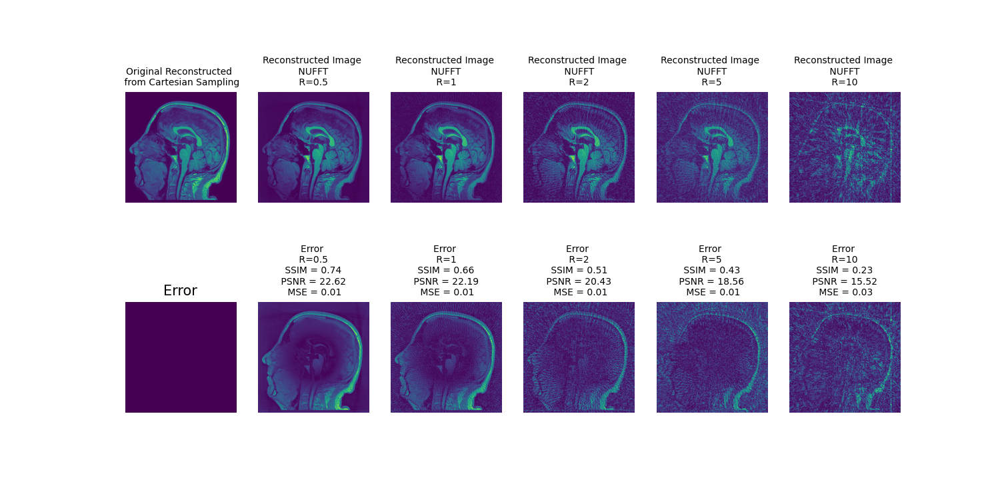

Image cart max = 549.0
Image cart min = 1.137345051484051e-13
512
Image radial max = 74964.3475220706
Image radial min = 7212.165919921079
Image radial max - norm = 1.0
Image radial min - norm = 0.0
Image cart max - norm = 1.0
Image cart min - norm = 0.0
SSIM: 0.7384519967328403
PSNR: 22.62013773786224
MSE: 0.0054699861438559745
256
Image radial max = 36833.36446124426
Image radial min = 6439.713407514123
Image radial max - norm = 1.0
Image radial min - norm = 0.0
Image cart max - norm = 1.0
Image cart min - norm = 0.0
SSIM: 0.6553946148594814
PSNR: 22.193758244432424
MSE: 0.00603426217775143
128
Image radial max = 18272.30740947183
Image radial min = 6425.543206628155
Image radial max - norm = 1.0
Image radial min - norm = 0.0
Image cart max - norm = 1.0
Image cart min - norm = 0.0
SSIM: 0.5050842365743639
PSNR: 20.425154946265323
MSE: 0.00906743613483742
51
Image radial max = 8303.172091657249
Image radial min = 3452.782335179844
Image radial max - norm = 1.0
Image radial min - norm 

In [10]:
# Different R values - NUFFT-based reconstruction method
#R = [2,4,6,8,10]
R = [0.5,1,2,5,10]

fig, ax = plt.subplots(nrows=2, ncols=len(R) + 1, figsize=(12, 6),sharex=True, sharey=True)
#plt.gray()

ax[0][0].imshow(np.abs(image_cart))
ax[0][0].axis('off')
ax[0][0].set_title('Original Reconstructed \n from Cartesian Sampling',size = 8)
ax[1][0].imshow(np.abs(image_cart-image_cart))
ax[1][0].axis('off')
ax[1][0].set_title('Error',size = 12)
print(f'Image cart max = {np.abs(np.max(image_cart))}')
print(f'Image cart min = {np.abs(np.min(image_cart))}')

i = 1

for c in R:
    spikes = int(np.round(256/c)) # This needs to be an integer
    print(spikes)
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden = False)
    # Interpolation in kspace with offset 128
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Transformation into space domain - Image reconstruction
    dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
    image_rad_off = sp.nufft_adjoint(kspace_rad_off * dcf_rad_off, coord_radial, oshape = np.shape(slice_img)) # Adjoint non-uniform Fast Fourier Transform.
    
    # Visualizing results
    print(f'Image radial max = {np.abs(np.max(image_rad_off))}')
    print(f'Image radial min = {np.abs(np.min(image_rad_off))}')
    image_cart_norm, image_rad_off_norm  = Normalization(np.abs(image_cart), np.abs(image_rad_off))
    print(f'Image radial max - norm = {np.abs(np.max(image_rad_off_norm))}')
    print(f'Image radial min - norm = {np.abs(np.min(image_rad_off_norm))}')
    print(f'Image cart max - norm = {np.abs(np.max(image_cart_norm))}')
    print(f'Image cart min - norm = {np.abs(np.min(image_cart_norm))}')
    
    SSIM,PSNR,MSE = Quantitative_f(image_cart_norm,image_rad_off_norm)
    ax[0][i].imshow(np.abs(image_rad_off))
    ax[0][i].axis('off')
    ax[0][i].set_title(f'Reconstructed Image \n NUFFT \n R={c} ',size = 8)
    
    #a,b = Normalization(image_cart,(np.abs(image_cart_norm) - np.abs(image_rad_off_norm)))
    #ax[1][i].imshow(b)
    ax[1][i].imshow(np.abs(np.abs(image_cart_norm) - np.abs(image_rad_off_norm)))
    ax[1][i].axis('off')
    ax[1][i].set_title(f'Error \n R={c} \n SSIM = {np.round(SSIM,2)} \n PSNR = {np.round(PSNR,2)} \n MSE = {np.round(MSE,2)}',size = 8)
    i = i+1
    


<IPython.core.display.Javascript object>


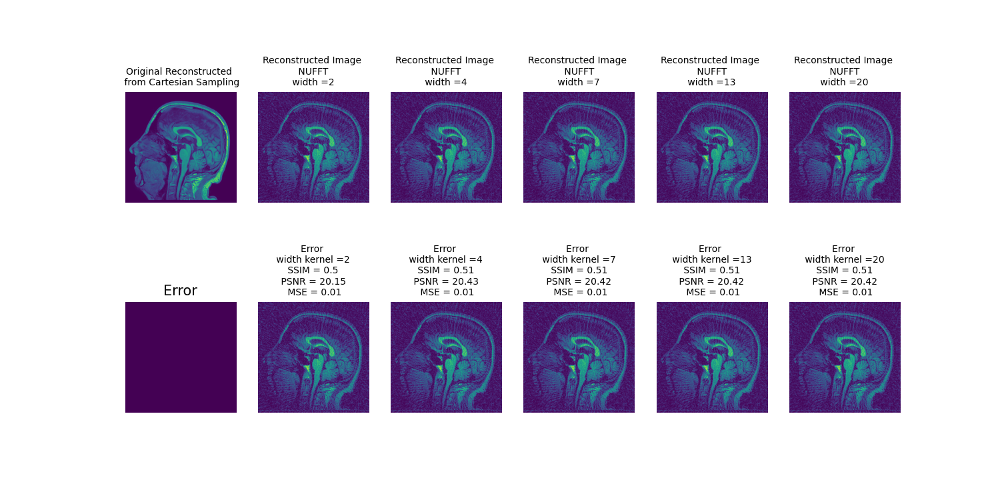

Image cart max = 549.0
Image cart min = 1.137345051484051e-13
128
Image radial max = 18320.29431279629
Image radial min = 6191.7222552710455
Image radial max - norm = 1.0
Image radial min - norm = 0.0
Image cart max - norm = 1.0
Image cart min - norm = 0.0
SSIM: 0.49625205135517614
PSNR: 20.148177120193846
MSE: 0.009664564480998148
128
Image radial max = 18272.30740947183
Image radial min = 6425.543206628155
Image radial max - norm = 1.0
Image radial min - norm = 0.0
Image cart max - norm = 1.0
Image cart min - norm = 0.0
SSIM: 0.5050842365743639
PSNR: 20.425154946265323
MSE: 0.00906743613483742
128
Image radial max = 18271.788777389655
Image radial min = 6427.445567746528
Image radial max - norm = 1.0
Image radial min - norm = 0.0
Image cart max - norm = 1.0
Image cart min - norm = 0.0
SSIM: 0.5050115166410727
PSNR: 20.42476352582768
MSE: 0.00906825340052072
128
Image radial max = 18271.790286828946
Image radial min = 6427.434368555012
Image radial max - norm = 1.0
Image radial min - 

In [12]:
# Different Kernel width for interpolation - NUFFT-based reconstruction method
width = [2, 4, 7, 13, 20]

fig, ax = plt.subplots(nrows=2, ncols=len(width) + 1, figsize=(12, 6),sharex=True, sharey=True)
#plt.gray()

ax[0][0].imshow(np.abs(image_cart))
ax[0][0].axis('off')
ax[0][0].set_title('Original Reconstructed \n from Cartesian Sampling',size = 8)
ax[1][0].imshow(np.abs(image_cart-image_cart))
ax[1][0].axis('off')
ax[1][0].set_title('Error',size = 12)
print(f'Image cart max = {np.abs(np.max(image_cart))}')
print(f'Image cart min = {np.abs(np.min(image_cart))}')

i = 1
spikes = 128

for w in width:
    print(spikes)
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden = False)
    # Interpolation in kspace with offset 128
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Transformation into space domain - Image reconstruction
    dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
    image_rad_off = sp.nufft_adjoint(kspace_rad_off * dcf_rad_off, coord_radial, oshape = np.shape(slice_img), width = w) # Adjoint non-uniform Fast Fourier Transform.
    
    # Visualizing results
    print(f'Image radial max = {np.abs(np.max(image_rad_off))}')
    print(f'Image radial min = {np.abs(np.min(image_rad_off))}')
    image_cart_norm, image_rad_off_norm  = Normalization(np.abs(image_cart), np.abs(image_rad_off))
    print(f'Image radial max - norm = {np.abs(np.max(image_rad_off_norm))}')
    print(f'Image radial min - norm = {np.abs(np.min(image_rad_off_norm))}')
    print(f'Image cart max - norm = {np.abs(np.max(image_cart_norm))}')
    print(f'Image cart min - norm = {np.abs(np.min(image_cart_norm))}')
    
    SSIM,PSNR,MSE = Quantitative_f(image_cart_norm,image_rad_off_norm)
    ax[0][i].imshow(np.abs(image_rad_off))
    ax[0][i].axis('off')
    ax[0][i].set_title(f'Reconstructed Image \n NUFFT \n width ={w} ',size = 8)
    
    #a,b = Normalization(image_cart,(np.abs(image_cart_norm) - np.abs(image_rad_off_norm)))
    #ax[1][i].imshow(b)
    ax[1][i].imshow(np.abs(image_cart - image_rad_off))
    ax[1][i].axis('off')
    ax[1][i].set_title(f'Error \n width kernel ={w} \n SSIM = {np.round(SSIM,2)} \n PSNR = {np.round(PSNR,2)} \n MSE = {np.round(MSE,2)}',size = 8)
    i = i+1

<IPython.core.display.Javascript object>


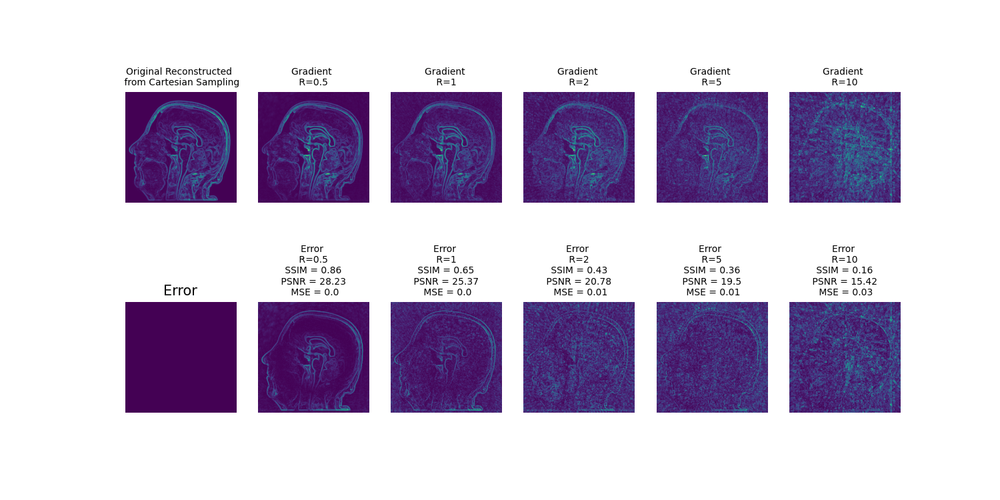

512
SSIM: 0.8624526450702045
PSNR: 28.225057874362825
MSE: 0.0015048534648945417
256
SSIM: 0.650962220062854
PSNR: 25.367046808449487
MSE: 0.0029059980541205266
128
SSIM: 0.4310992435488705
PSNR: 20.777899588140993
MSE: 0.008360072450978789
51
SSIM: 0.3551945295674716
PSNR: 19.495360053513945
MSE: 0.011232178450057934
26
SSIM: 0.16351930645263824
PSNR: 15.422974189874312
MSE: 0.028688152511427888


In [13]:
# Gradient - Different values of R for the NUFFT-based reconstruction method 
R = [0.5,1,2,5,10]

fig, ax = plt.subplots(nrows=2, ncols=len(R) + 1, figsize=(12, 6),sharex=True, sharey=True)
#plt.gray()
d1 = filters.sobel(np.abs(image_cart))
ax[0][0].imshow(d1)
ax[0][0].axis('off')
ax[0][0].set_title('Original Reconstructed \n from Cartesian Sampling',size = 8)
d = filters.sobel(np.abs(image_cart))-filters.sobel(np.abs(image_cart))
ax[1][0].imshow(d)
ax[1][0].axis('off')
ax[1][0].set_title('Error',size = 12)

i = 1

for c in R:
    spikes = int(np.round(256/c)) # This needs to be an integer
    print(spikes)
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden = False)
    # Interpolation in kspace with offset 128
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Transformation into space domain - Image reconstruction
    dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
    image_rad_off = sp.nufft_adjoint(kspace_rad_off * dcf_rad_off, coord_radial, oshape = np.shape(slice_img)) # Adjoint non-uniform Fast Fourier Transform.
    
    # Visualizing results
    image_cart_norm, image_rad_off_norm  = Normalization(filters.sobel(np.abs(image_cart)),filters.sobel(np.abs(image_rad_off)))
    SSIM,PSNR,MSE = Quantitative_f(image_cart_norm,image_rad_off_norm)
    ax[0][i].imshow(np.abs(image_rad_off_norm))
    ax[0][i].axis('off')
    ax[0][i].set_title(f'Gradient \n R={c} ',size = 8)
    #ax[1][i].imshow((np.abs(image_cart_norm) - np.abs(image_rad_off_norm)))
    ax[1][i].imshow(np.abs(image_cart_norm - image_rad_off_norm))
    ax[1][i].axis('off')
    ax[1][i].set_title(f'Error \n R={c} \n SSIM = {np.round(SSIM,2)} \n PSNR = {np.round(PSNR,2)} \n MSE = {np.round(MSE,2)}',size = 8)
    i = i+1

SSIM: 0.5050842365743639
PSNR: 20.425154946265323
MSE: 0.00906743613483742


<IPython.core.display.Javascript object>


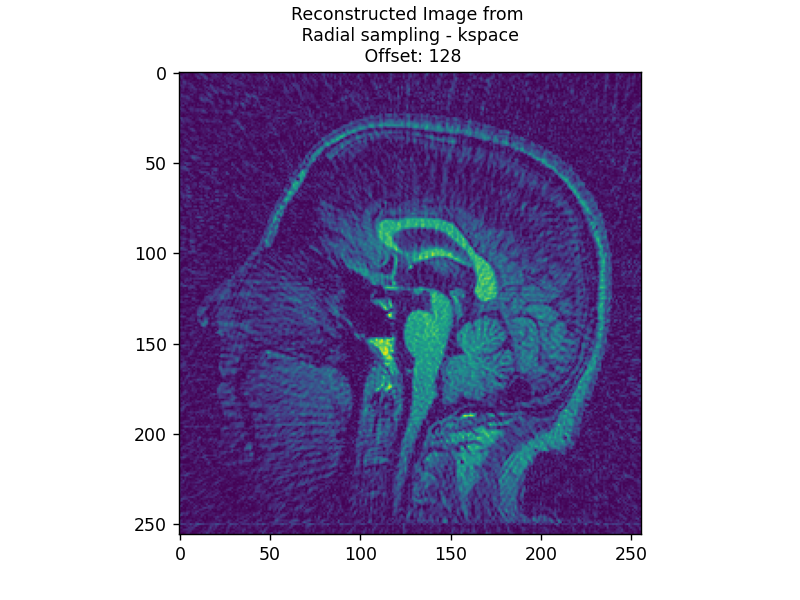

0.5050842365743639 20.425154946265323 0.00906743613483742
(256, 256)


In [14]:
# Reconstruct the image from radial sampling in k-space using the Non Uniform Fast Fourier Transform
spikes = 128 # Number of lines in the kspace
# Radial coordinates of the k-space with radial sampling
coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden = False)
# Interpolation in kspace with offset 128
kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
# Transformation into space domain - Image reconstruction
dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
image_rad_off = sp.nufft_adjoint(kspace_rad_off * dcf_rad_off, coord_radial, oshape = np.shape(slice_img)) # Adjoint non-uniform Fast Fourier Transform.

# Visualizing results
image_cart_norm, image_rad_off_norm  = Normalization(np.abs(image_cart), np.abs(image_rad_off))
SSIM_NUFFT,PSNR_NUFFT,MSE_NUFFT = Quantitative_f(image_cart_norm,image_rad_off_norm)
# With 128 offset
# First, we will need the density compensation factor (dcf). For the projection reconstruction trajectory, 
# is proportional to the radius of the k-space coordinates.
show_image(image_rad_off,f'Reconstructed Image from \n Radial sampling - kspace \n Offset: {128}')

print(SSIM_NUFFT,PSNR_NUFFT,MSE_NUFFT)
print(np.shape(image_rad_off)) 

<IPython.core.display.Javascript object>


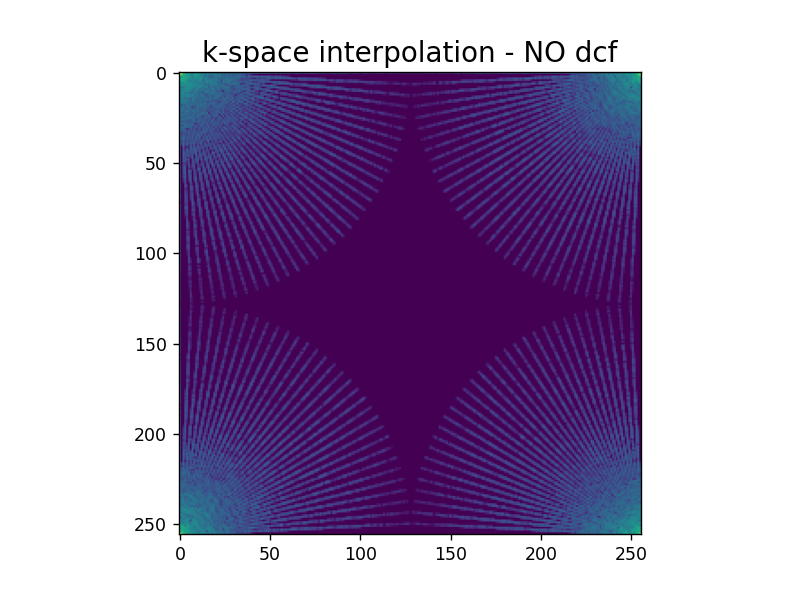

SSIM: 0.29214771043889537
PSNR: 11.78547212104048
MSE: 0.06629072791780563


<IPython.core.display.Javascript object>


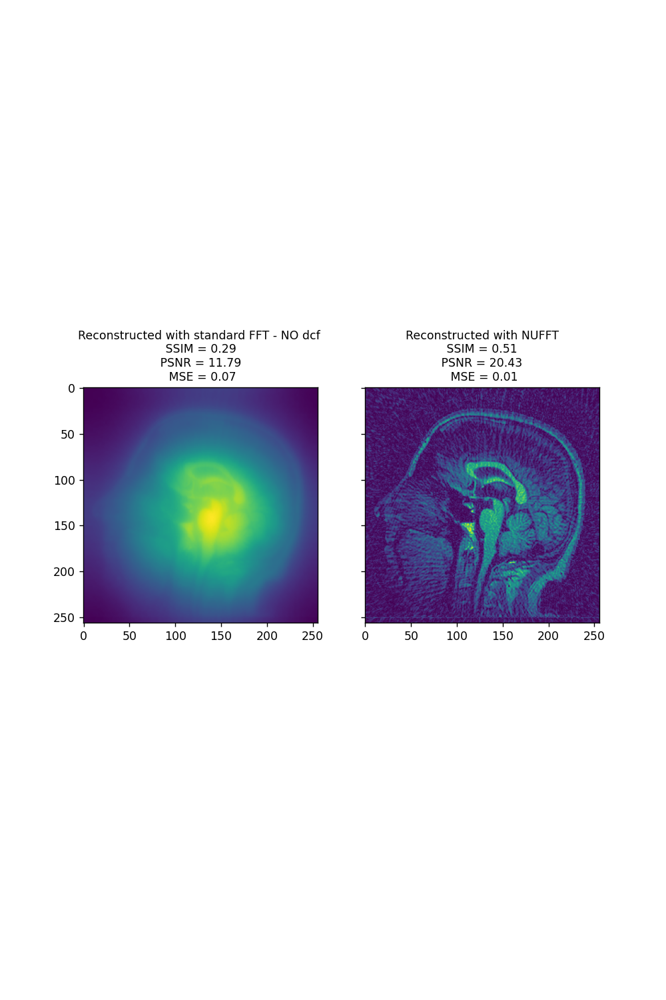

<IPython.core.display.Javascript object>


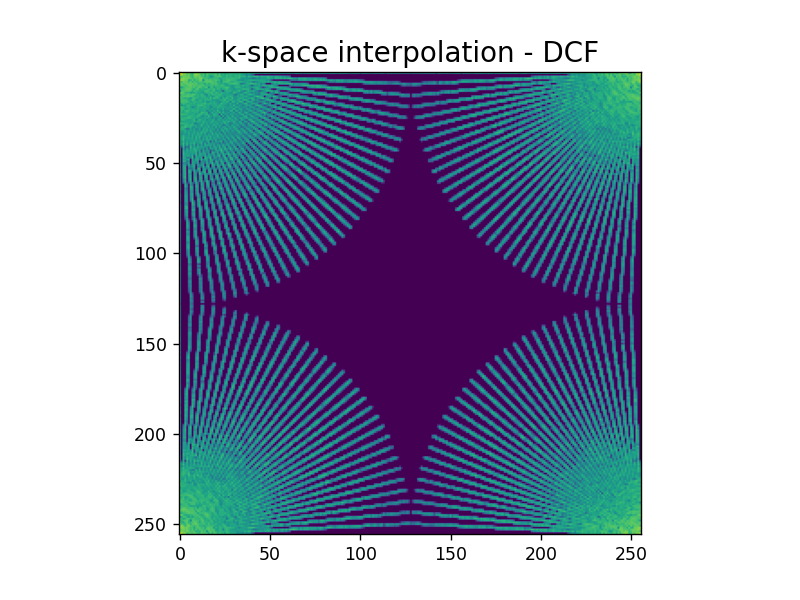

SSIM: 0.4835812339480848
PSNR: 18.355604193320726
MSE: 0.014602915785908216


C:\Users\Anuska\AppData\Local\Temp\ipykernel_1036\1240938094.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 12),sharex=True, sharey=True)


<IPython.core.display.Javascript object>


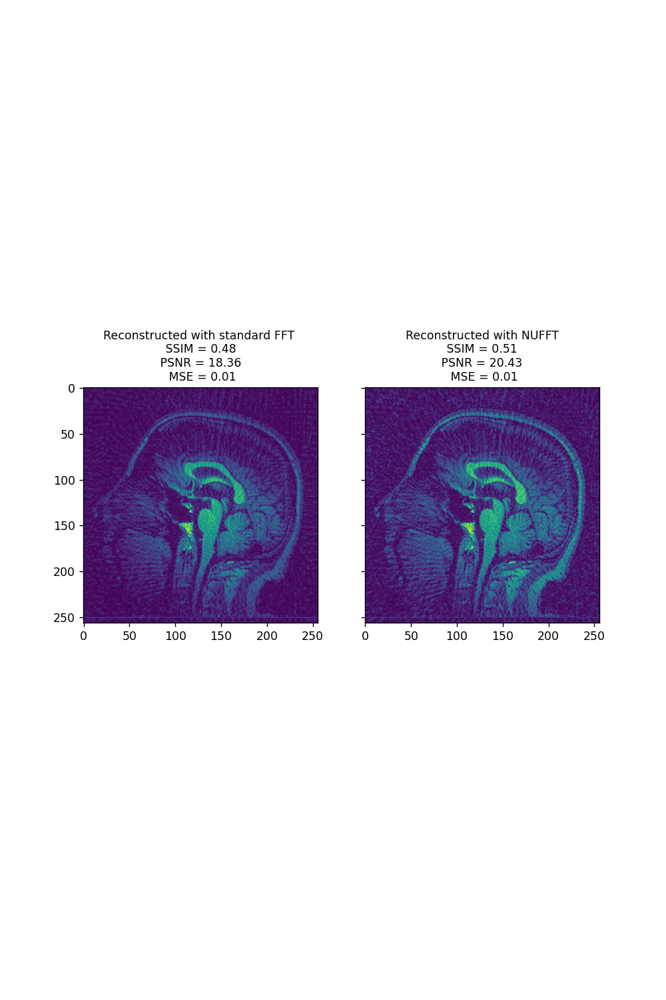

Text(0.5, 1.0, 'Reconstructed with NUFFT\n SSIM = 0.51 \n PSNR = 20.43 \n MSE = 0.01')

In [15]:
# Reconstruct the image from radial sampling in K-space using the Uniform Fast Fourier Transform

# link: https://sigpy.readthedocs.io/en/latest/_modules/sigpy/fourier.html
# Normal iFFT - without DCF compensation
kspace_rad_off_cart2 = sp.gridding(kspace_rad_off, coord_radial, shape=(256, 256))
show_kspace(kspace_rad_off_cart2,'k-space interpolation - NO dcf')
image_rad_fft2 = sp.ifft(kspace_rad_off_cart2, oshape = np.shape(slice_img)) # multiplication with compensation factor
image_cart_norm2, image_rad_fft_norm2  = Normalization(np.abs(image_cart), np.abs(image_rad_fft2))
SSIM,PSNR,MSE = Quantitative_f(image_cart_norm2,image_rad_fft_norm2)

# Comparison between the two Fourier Transform: iFFT no DCF - NUFFT
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 12),sharex=True, sharey=True)
ax[0].imshow(np.abs(image_rad_fft2))#, cmap='gray')
ax[0].axis('on')
ax[0].set_title(f'Reconstructed with standard FFT - NO dcf \n SSIM = {np.round(SSIM,2)} \n PSNR = {np.round(PSNR,2)} \n MSE = {np.round(MSE,2)}',size = 10)
ax[1].imshow(np.abs(image_rad_off))#, cmap='gray')
ax[1].axis('on')
ax[1].set_title(f'Reconstructed with NUFFT\n SSIM = {np.round(SSIM_NUFFT,2)} \n PSNR = {np.round(PSNR_NUFFT,2)} \n MSE = {np.round(MSE_NUFFT,2)}',size = 10)


# Normal iFFT - with DCF compensation
kspace_rad_off_cart = sp.gridding(kspace_rad_off*dcf_rad_off, coord_radial, shape=(256, 256))
show_kspace(kspace_rad_off_cart,'k-space interpolation - DCF')

image_rad_fft = sp.ifft(kspace_rad_off_cart, oshape = np.shape(slice_img)) # multiplication with compensation factor
image_cart_norm, image_rad_fft_norm  = Normalization(np.abs(image_cart), np.abs(image_rad_fft))
SSIM,PSNR,MSE = Quantitative_f(image_cart_norm,image_rad_fft_norm)

# Comparison between the two Fourier Transform
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 12),sharex=True, sharey=True)
#plt.gray()
ax[0].imshow(np.abs(image_rad_fft))#, cmap='gray')
ax[0].axis('on')
ax[0].set_title(f'Reconstructed with standard FFT \n SSIM = {np.round(SSIM,2)} \n PSNR = {np.round(PSNR,2)} \n MSE = {np.round(MSE,2)}',size = 10)
ax[1].imshow(np.abs(image_rad_off))#, cmap='gray')
ax[1].axis('on')
ax[1].set_title(f'Reconstructed with NUFFT\n SSIM = {np.round(SSIM_NUFFT,2)} \n PSNR = {np.round(PSNR_NUFFT,2)} \n MSE = {np.round(MSE_NUFFT,2)}',size = 10)



(256, 256)
<class 'numpy.ndarray'>
(256, 256)
<class 'numpy.ndarray'>


<IPython.core.display.Javascript object>


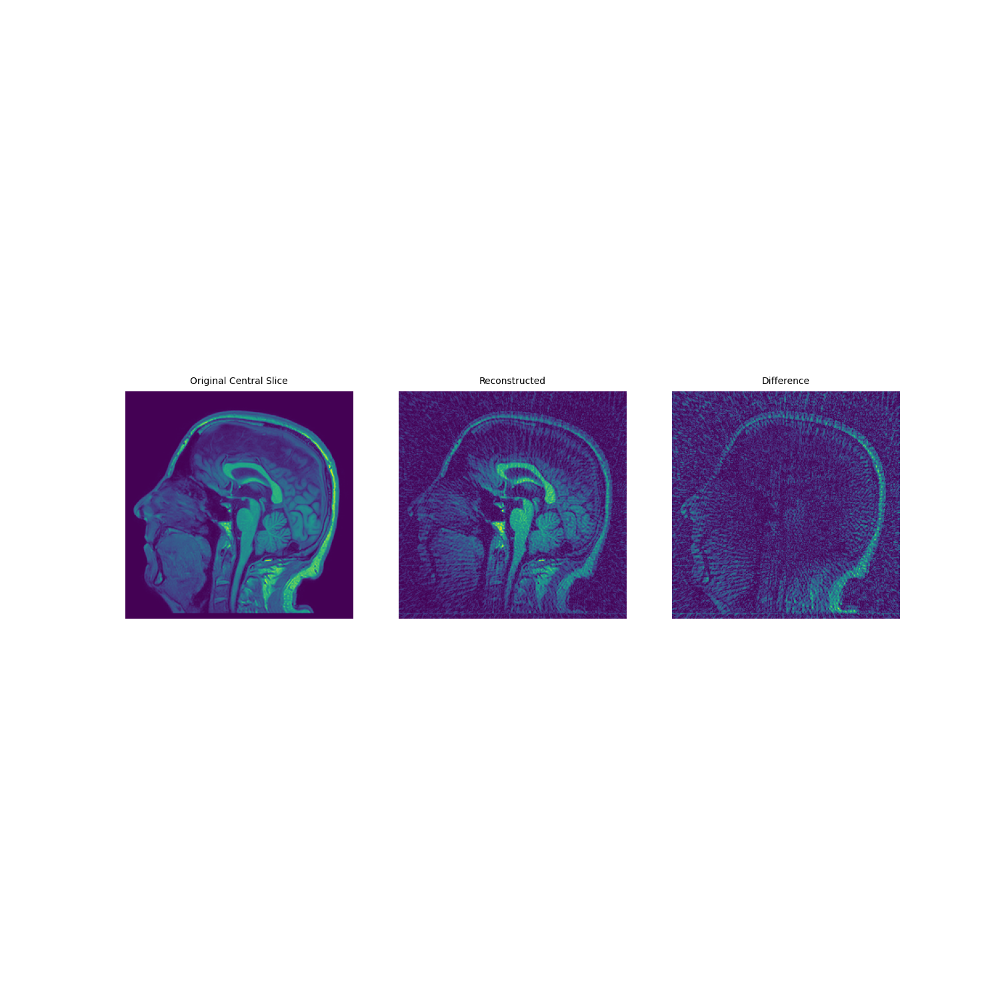

<IPython.core.display.Javascript object>


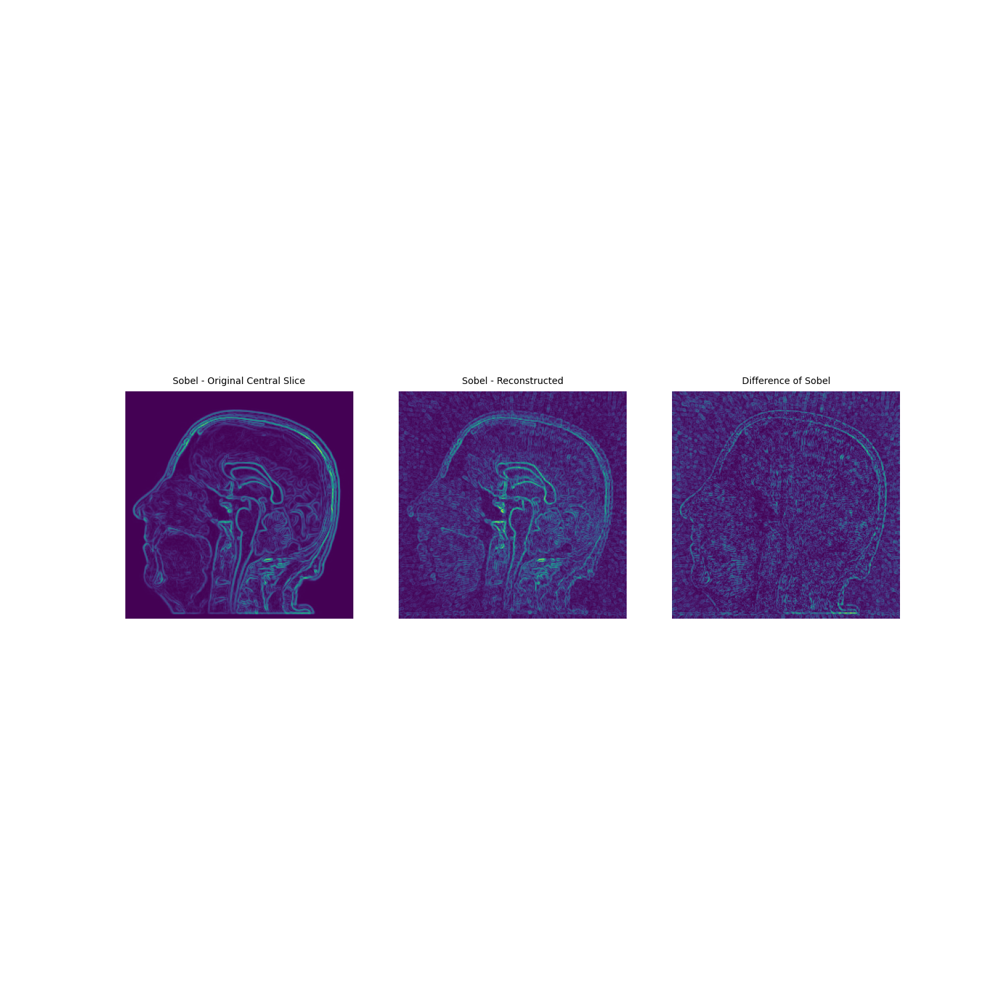

SSIM: 0.5050842365743639
PSNR: 20.425154946265323
MSE: 0.00906743613483742


In [16]:
print(np.shape(slice_img))
print(type(slice_img))
print(np.shape(image_rad_off))
print(type(image_rad_off))

image_cart_norm, image_rad_off_norm = Normalization(np.abs(image_cart), np.abs(image_rad_off))
DiffMap(image_cart_norm,image_rad_off_norm)
DiffGradient(image_cart_norm,image_rad_off_norm)
SSIM, PSNR, MSE = Quantitative_f(np.abs(image_cart_norm),np.abs(image_rad_off_norm))

From the picture of the difference of the gradient of our images, we notice that with the undersampling method we lose high frequency content (fast changes in intensity between contiguos pixels). This is reflected on big errors on the edges (3rd image, difference of sobel). 

In [17]:
print(np.max(np.abs(image_cart)))
print(np.max(np.abs(image_rad_off)))
# We need to normalize the range of pixel values

549.0
18272.30740947183


# Task 4 - Other Reconstruction Methods 

## Task 4.1: Wavelet to perform compressed sensing reconstruction 
https://sigpy.readthedocs.io/en/latest/generated/sigpy.mri.app.L1WaveletRecon.html



MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


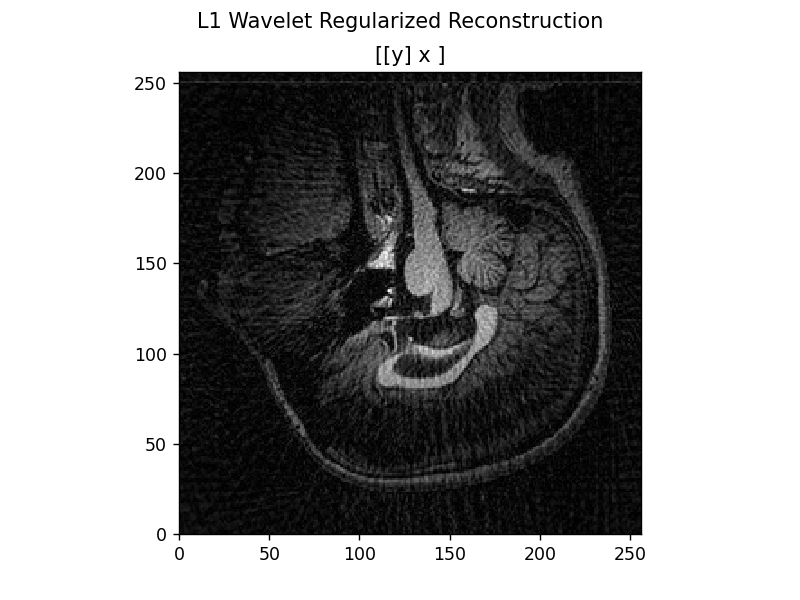

NameError: name 'ndi' is not defined

In [18]:
# Estimation of the calibration maps --> since we have just one coil the sensitivity map is assumed to be max everywhere. 
# It means that is a matrix equal to 1 everywhere
size_x, size_y = np.shape(kspace_rad_off_cart) 
mps = np.ones((1,size_x, size_y)) # first dimension is the number of coil
#print(mps.shape)
#pl.ImagePlot(np.log(np.abs(mps)), title = 'Sensitivity map')#sigpy.plot.ImagePlot --> why it is all black ? 
lamda = 0.0005 # same value of the tutorial
Waveletl1_recon= sp.mri.app.L1WaveletRecon(kspace_rad_off_cart, mps, lamda).run()
pl.ImagePlot(Waveletl1_recon, title = 'L1 Wavelet Regularized Reconstruction')#sigpy.plot.ImagePlot

# 'Right image'
slice_img_rotate = ndi.rotate(Waveletl1_recon, -180, reshape=False)
slice_img_rf = np.fliplr(slice_img_rotate)
pl.ImagePlot(slice_img_rf, title = 'L1 Wavelet Regularized Reconstruction')

<IPython.core.display.Javascript object>


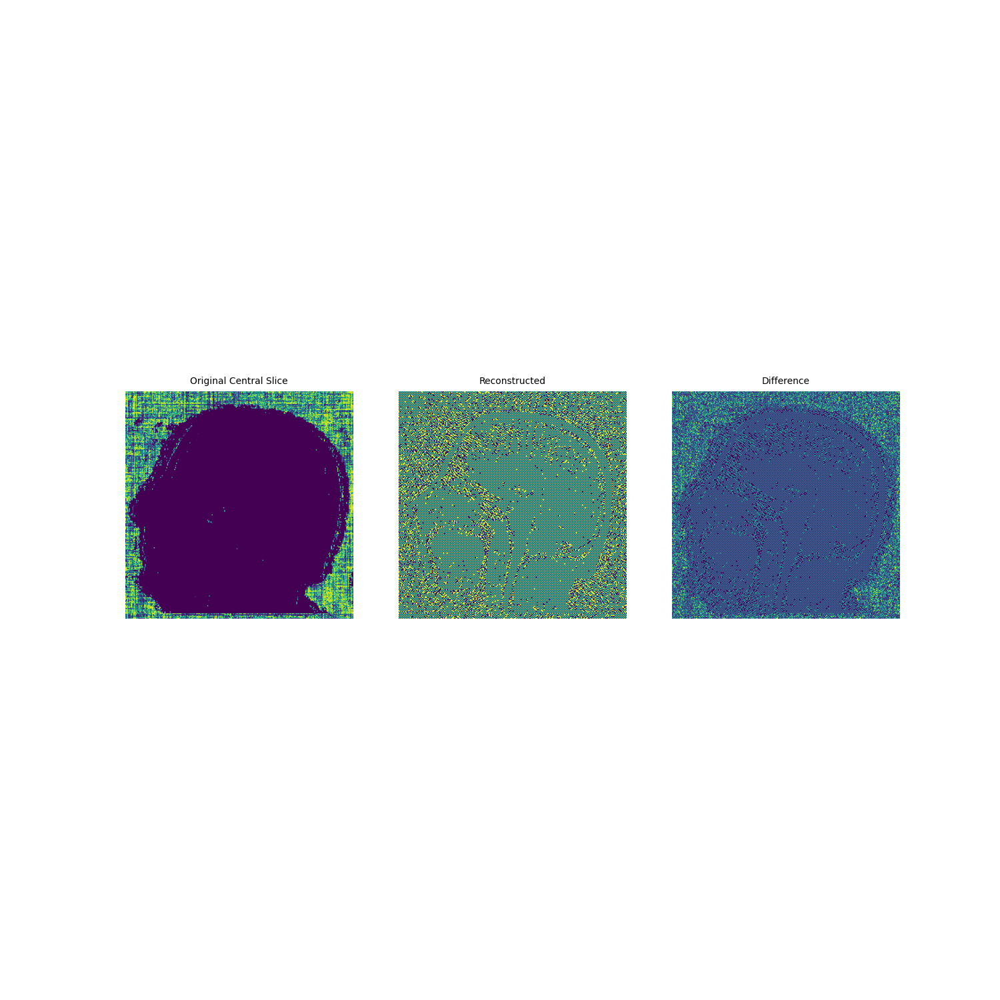

-3.141488486923503
3.141592653589793


<IPython.core.display.Javascript object>


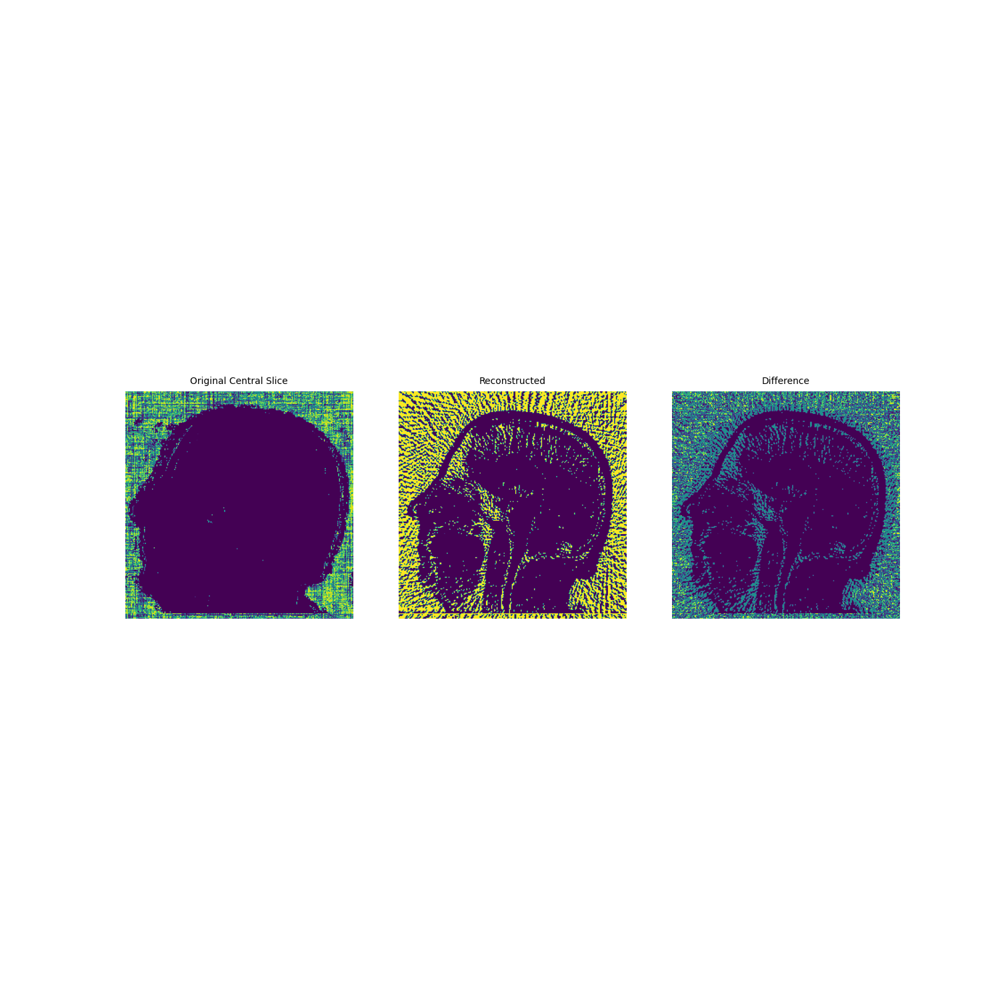

In [19]:
# Phase in space domain
# Difference on the phase value between the original slice and the wavelet-based reconstruction
phaseoriginal, phaserecon = PhaseDifference(image_cart, Waveletl1_recon)
print(np.min(phaseoriginal))
print(np.max(phaserecon))
# Difference on the phase value between the original slice and the NUFFT reconstruction
phaseoriginal, phaserecon = PhaseDifference(image_cart, image_rad_off)


<IPython.core.display.Javascript object>


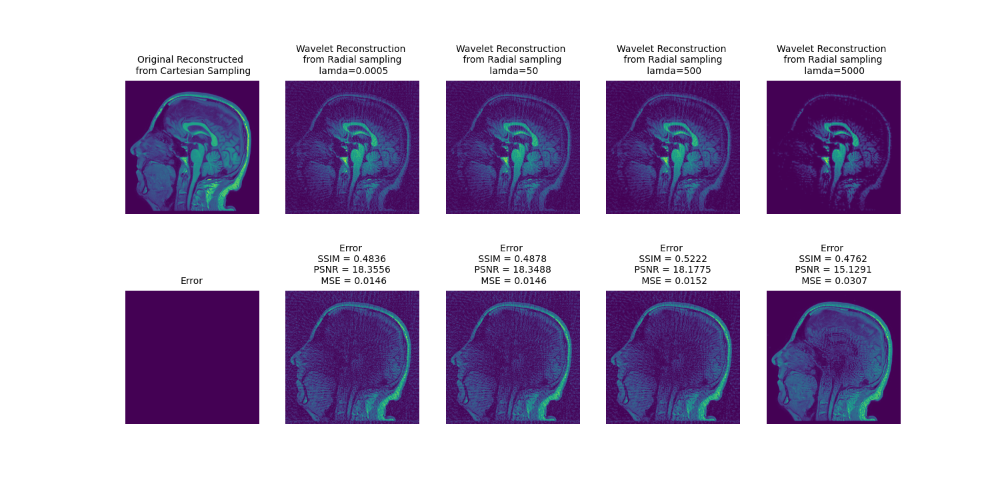

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.4835812667923531
PSNR: 18.35560453920625
MSE: 0.014602914622886987
1.0
1.0


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.4877934426654004
PSNR: 18.34877480186782
MSE: 0.014625897308067239
1.0
1.0


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.522219288493187
PSNR: 18.177457617173324
MSE: 0.015214379268806628
1.0
1.0


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.4762486084110551
PSNR: 15.129057344709569
MSE: 0.030696882054234965
1.0
1.0


In [20]:
# L1 Wavelet Reconstruction - Testing the effect of lambda parameter (lamda doesn't affect our result)
lamda = [0.0005, 50, 500, 5000]

fig, ax = plt.subplots(nrows=2, ncols=len(lamda) + 1, figsize=(12, 6),sharex=True, sharey=True)
#plt.gray()

ax[0][0].imshow(np.abs(image_cart))#, cmap='gray')
ax[0][0].axis('off')
ax[0][0].set_title('Original Reconstructed \n from Cartesian Sampling',size = 8)

ax[1][0].imshow(np.abs(image_cart-image_cart))#, cmap='gray')
ax[1][0].axis('off')
ax[1][0].set_title('Error',size = 8)

i =1
for l in lamda:
    Waveletl1_recon= sp.mri.app.L1WaveletRecon(kspace_rad_off_cart, mps, l).run()
    image_cart_norm, Waveletl1_recon_norm  = Normalization(np.abs(image_cart), np.abs(Waveletl1_recon))
    SSIM,PSNR,MSE = Quantitative_f(image_cart_norm,Waveletl1_recon_norm)
    print(np.max(image_cart_norm))
    print(np.max(Waveletl1_recon_norm))
    
    ax[0][i].imshow(np.abs(Waveletl1_recon_norm))#, cmap='gray')
    ax[0][i].axis('off')
    ax[0][i].set_title(f'Wavelet Reconstruction \n from Radial sampling \n lamda={l}',size = 8)
    
    ax[1][i].imshow(np.abs(Waveletl1_recon_norm-image_cart_norm))#, cmap='gray')
    ax[1][i].axis('off')
    ax[1][i].set_title(f'Error \n SSIM = {np.round(SSIM,4)} \n PSNR = {np.round(PSNR,4)} \n MSE = {np.round(MSE,4)}',size = 8)
    i = i+1
    

<IPython.core.display.Javascript object>


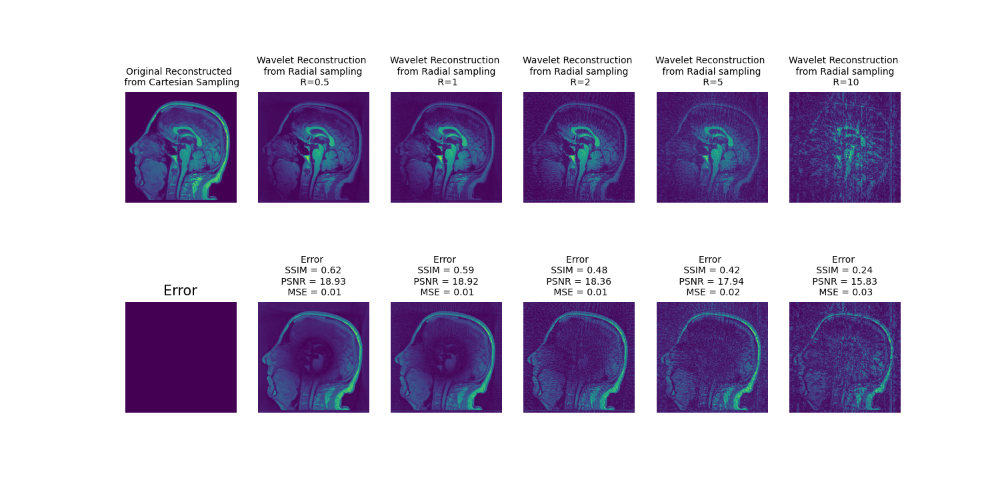

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.6192394315019026
PSNR: 18.93319779832089
MSE: 0.012784396164989786


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.5867129064197835
PSNR: 18.919014322073966
MSE: 0.012826216543707067


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.48358156237718203
PSNR: 18.355607652467157
MSE: 0.01460290415472107


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.4151357106466169
PSNR: 17.938630339966892
MSE: 0.016074481234437422


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.23941492023301983
PSNR: 15.833883076639612
MSE: 0.02609826834868778


In [21]:
# L1 Wavelet Reconstruction - Different acceleration factors - R
R = [0.5,1,2,5,10]
lamda = 0.005

fig, ax = plt.subplots(nrows=2, ncols=len(R) + 1, figsize=(12, 6),sharex=True, sharey=True)
#plt.gray()

ax[0][0].imshow(np.abs(image_cart))#, cmap='gray')
ax[0][0].axis('off')
ax[0][0].set_title('Original Reconstructed \n from Cartesian Sampling',size = 8)

ax[1][0].imshow(np.abs(image_cart-image_cart))#, cmap='gray')
ax[1][0].axis('off')
ax[1][0].set_title(f'Error',size = 12)

i = 1

for c in R:
    spikes = int(np.round(256/c)) # This needs to be an integer
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden =  False)
    # Interpolation in kspace with offset 128
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Transformation into space domain - Image reconstruction
    dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
    kspace_rad_off_cart = sp.gridding(kspace_rad_off*dcf_rad_off, coord_radial, shape=(256, 256))
    # Estimate the sensitive map
    size_x, size_y = np.shape(kspace_rad_off_cart) 
    mps = np.ones((1,size_x, size_y)) # first dimension is the number of coil
    Waveletl1_recon= sp.mri.app.L1WaveletRecon(kspace_rad_off_cart, mps, lamda).run()
    # Visualizing results
    image_cart_norm, Waveletl1_recon_norm  = Normalization(np.abs(image_cart), np.abs(Waveletl1_recon))
    SSIM,PSNR,MSE = Quantitative_f(image_cart_norm,Waveletl1_recon_norm)
    ax[0][i].imshow(np.abs(Waveletl1_recon_norm))#, cmap='gray')
    ax[0][i].axis('off')
    ax[0][i].set_title(f'Wavelet Reconstruction \n from Radial sampling \n R={c}',size = 8)
    
    ax[1][i].imshow(np.abs(np.abs(Waveletl1_recon_norm)-image_cart_norm))#, cmap='gray')
    ax[1][i].axis('off')
    ax[1][i].set_title(f'Error \n SSIM = {np.round(SSIM,2)} \n PSNR = {np.round(PSNR,2)} \n MSE = {np.round(MSE,2)}',size = 8)
    i = i+1


## Task 4.2: Total Variation Reconstruction
https://sigpy.readthedocs.io/en/latest/generated/sigpy.mri.app.TotalVariationRecon.html
    

<IPython.core.display.Javascript object>


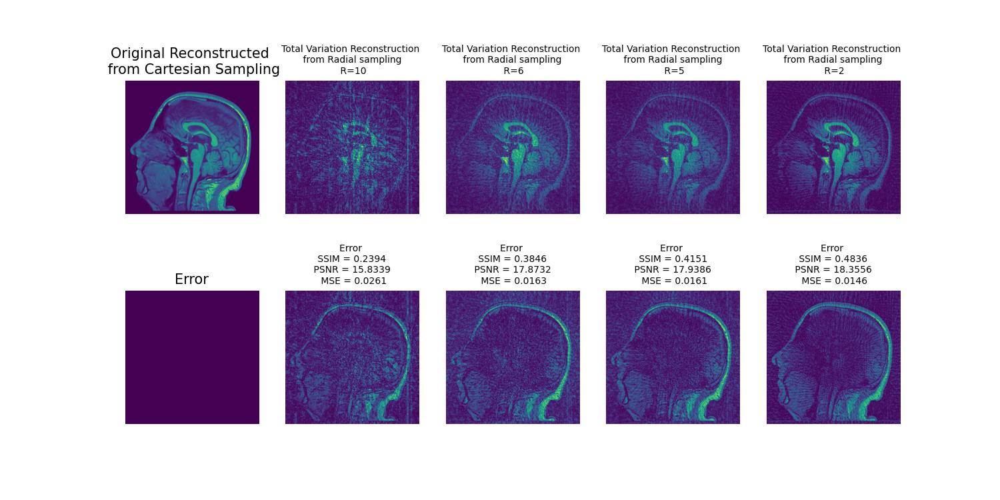

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

TotalVariationRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.23941484960132853
PSNR: 15.833853764830582
MSE: 0.026098444494153876


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

TotalVariationRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.38460685771745334
PSNR: 17.8732205654514
MSE: 0.01631841386554998


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

TotalVariationRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.4151351705091791
PSNR: 17.93860011578323
MSE: 0.016074593103177152


MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

TotalVariationRecon:   0%|          | 0/100 [00:00<?, ?it/s]

SSIM: 0.4835820422522359
PSNR: 18.355569023287657
MSE: 0.014603034043710706


In [22]:
# Trying to apply the reconstraction with different acceleration factors
R = [10,6,5,2]
lamda = 0.005

fig, ax = plt.subplots(nrows=2, ncols=len(R) + 1, figsize=(12, 6),sharex=True, sharey=True)
#plt.gray()

ax[0][0].imshow(np.abs(image_cart))#, cmap='gray')
ax[0][0].axis('off')
ax[0][0].set_title('Original Reconstructed \n from Cartesian Sampling',size = 12)

ax[1][0].imshow(np.abs(image_cart-image_cart))#, cmap='gray')
ax[1][0].axis('off')
ax[1][0].set_title('Error',size = 12)

i = 1

for c in R:
    spikes = int(np.round(256/c)) # This needs to be an integer
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden =  False)
    # Interpolation in kspace with offset 128
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Transformation into space domain - Image reconstruction
    dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
    kspace_rad_off_cart = sp.gridding(kspace_rad_off*dcf_rad_off, coord_radial, shape=(256, 256))
    # Estimate the sensitive map
    size_x, size_y = np.shape(kspace_rad_off_cart) 
    mps = np.ones((1,size_x, size_y)) # first dimension is the number of coil
    TotalVar_recon= sp.mri.app.TotalVariationRecon(kspace_rad_off_cart, mps, lamda).run()
    # Visualizing results
    image_cart_norm, TotalVar_recon_norm  = Normalization(np.abs(image_cart), np.abs(TotalVar_recon))
    SSIM,PSNR,MSE = Quantitative_f(image_cart_norm,TotalVar_recon_norm)
    ax[0][i].imshow(np.abs(TotalVar_recon_norm))#, cmap='gray')
    ax[0][i].axis('off')
    ax[0][i].set_title(f'Total Variation Reconstruction \n from Radial sampling \n R={c}',size = 8)
    
    ax[1][i].imshow(np.abs(np.abs(TotalVar_recon_norm)-(image_cart_norm)))#, cmap='gray')
    ax[1][i].axis('off')
    ax[1][i].set_title(f'Error \n SSIM = {np.round(SSIM,4)} \n PSNR = {np.round(PSNR,4)} \n MSE = {np.round(MSE,4)}',size = 8)
    i = i+1

## Task 5: CT reconstruction methods for radial MRI:
As we understood, we can apply the central slice theorem in this case. This theorem defends the idea that the Fourier transform in 2D of our image along a line (a spike in the MRI case) can be seen as the 1D Fourier transform of the Radon Transform (integral over the line of our object for a theta). In our case, we already have the 2D Fourier transform of each line in radial sampling, and we want to get the "Radon Transform" in order to filter (not totaly sure bc maybe we already did it with the density compensation) and back project it (maybe using FBP).

Let us refer to the one-dimensional (1D) inverse Fourier transform (of each spike) in the radial direction of the k-space measurements as the sinogram. After that, we can just think of our problem as a CT reconstruction situation, where we can reconstruct the image starting from the sinogram. The image reconstruction algorithm is chosen as the FBP algorithm.

https://scikit-image.org/docs/stable/auto_examples/transform/plot_radon_transform.html 

In [23]:
# This part has been done in a separate file - CT Reconstrcution.ipynb

## Task 7: 3D Reconstruction

Apply the best performing method for getting an acceleration of 5x and 10x in a 3D volume.

Hint: apply reconstruction to every slice in the 3D volume independently.


In [24]:
def multi_slice_viewer(volume):
    fig, ax = plt.subplots()
    ax.volume = volume
    ax.index = volume.shape[0] // 2
    ax.imshow(volume[ax.index])
    fig.canvas.mpl_connect('key_press_event', process_key)

def process_key(event):
    fig = event.canvas.figure
    ax = fig.axes[0]
    if event.key == 'p':
        previous_slice(ax)
    elif event.key == 'n':
        next_slice(ax)
    fig.canvas.draw()

def previous_slice(ax):
    """Go to the previous slice."""
    volume = ax.volume
    ax.index = (ax.index - 1) % volume.shape[0]  # wrap around using %
    ax.images[0].set_array(volume[ax.index])

def next_slice(ax):
    """Go to the next slice."""
    volume = ax.volume
    ax.index = (ax.index + 1) % volume.shape[0]
    ax.images[0].set_array(volume[ax.index])

In [25]:
# Using the NON UNIFORM FFT
# R = [5, 10]
R = 5
N_slices = t1_data.shape[2]
#print(N_slices)
final_3D = []

i = 1

# for c in R:
for s in range(N_slices):
    # Slice selection
    img_slice = t1_data[0,0,s,:,:]
    # Cartesian sampling - kspace
    kspace_cart = fftc_2d(img_slice)
    # Number of spikes for an acceleration of R
    spikes = int(np.round(256/R)) # This needs to be an integer
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden =  False)
    # Interpolation in kspace with offset 128
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Transformation into space domain - Image reconstruction
    dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
    image_rad_off = sp.nufft_adjoint(kspace_rad_off * dcf_rad_off, coord_radial, oshape = np.shape(slice_img)) # Adjoint non-uniform Fast Fourier Transform.
    final_3D.append(image_rad_off)



In [26]:
final_3D = np.array(final_3D).reshape([t1_data.shape[2],t1_data.shape[3],t1_data.shape[4]])
print(np.shape(final_3D))



(90, 256, 256)


<IPython.core.display.Javascript object>


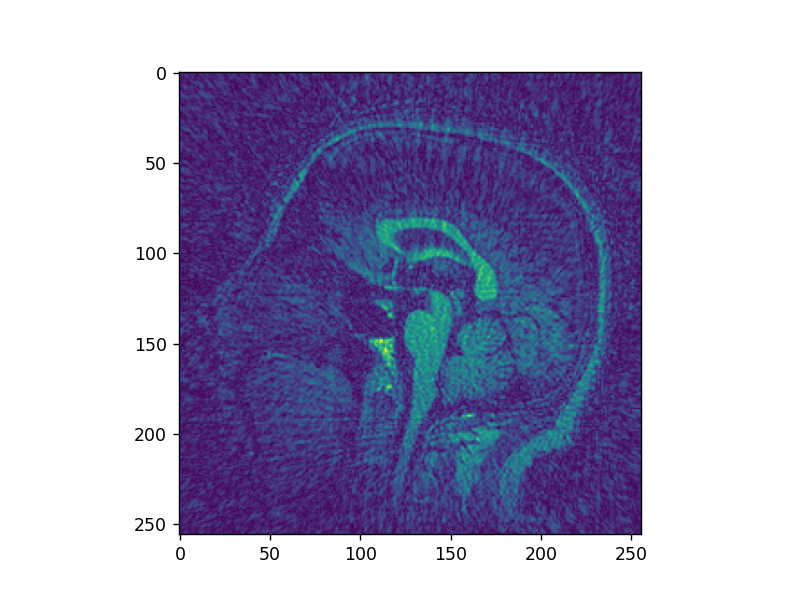

In [28]:
# All the slices at the same time
multi_slice_viewer(np.abs(final_3D))

In [29]:
# R = [5, 10]
R = 5
N_slices = t1_data.shape[2]
#print(N_slices)
final_3D = []

i = 1

# for c in R:
for s in range(N_slices):
    # Slice selection
    img_slice = t1_data[0,0,s,:,:]
    # Cartesian sampling - kspace
    kspace_cart = fftc_2d(img_slice)
    # Number of spikes for an acceleration of R
    spikes = int(np.round(256/R)) # This needs to be an integer
    # Radial coordinates of the k-space with radial sampling
    coord_radial = sp.mri.radial([spikes,256,2],[256,256], golden =  False)
    # Interpolation in kspace with offset 128
    kspace_rad_off = sp.interpolate(kspace_cart,coord_radial + int(256/2)) # In the example code, they use some offset
    # Transformation into space domain - Image reconstruction
    dcf_rad_off = (coord_radial[..., 0]**2 + coord_radial[..., 1]**2)**0.5
    kspace_rad_off_cart = sp.gridding(kspace_rad_off*dcf_rad_off, coord_radial, shape=(256, 256))
    # Estimate the sensitive map
    size_x, size_y = np.shape(kspace_rad_off_cart) 
    mps = np.ones((1,size_x, size_y)) # first dimension is the number of coil
    Waveletl1_recon= sp.mri.app.L1WaveletRecon(kspace_rad_off_cart, mps, lamda).run()
    final_3D.append(Waveletl1_recon)



MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

MaxEig:   0%|          | 0/30 [00:00<?, ?it/s]

L1WaveletRecon:   0%|          | 0/100 [00:00<?, ?it/s]

In [30]:
final_3D = np.array(final_3D).reshape([t1_data.shape[2],t1_data.shape[3],t1_data.shape[4]])
print(np.shape(final_3D))

(90, 256, 256)


<IPython.core.display.Javascript object>


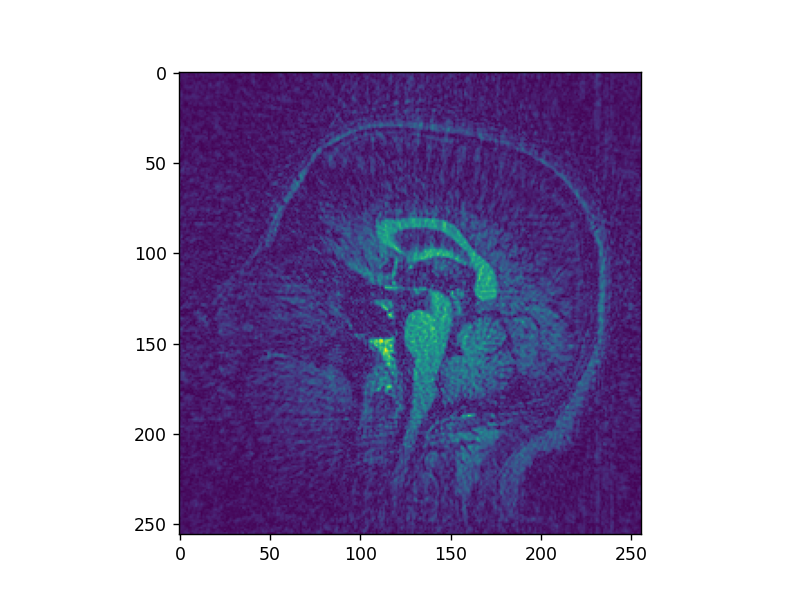

In [31]:
multi_slice_viewer(np.abs(final_3D))